In [1]:
from netCDF4 import Dataset
import xarray as xr
import cartopy
import cartopy.feature as cfeat
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import numpy as np
import math
from mpl_toolkits.axes_grid1 import make_axes_locatable

'/Users/dekergaradecerwan/Work/Trainings/Mindfuel_1221/notebooks'

ecmwf reananalyse -> era interim era5
ccmp rt, -> QuikSCAT and ASCAT scatterometer wind vectors, moored buoy wind data, and ERA-Interim model 



In [9]:
my_example_nc_file = '../data/remss/202011/CCMP_RT_Wind_Analysis_20201115_V02.1_L3.0_RSS.nc'
# fh = Dataset(my_example_nc_file, mode='r')

ncw = xr.open_dataset(my_example_nc_file)
nc2 = ncw.sel(time = slice('2020-11-15T06:00:00', '2020-11-15T06:00:00')).mean('time')
lon = nc2['longitude']
lat = nc2['latitude']

latidx1 = (lat >=30 ) & (lat <=50 ) 
lonidx1 = (lon>=340) 
u = nc2['uwnd'][latidx1,lonidx1]
v = nc2['vwnd'][latidx1,lonidx1]
#u = nc2['u10'][latidx1,lonidx1]
#v = nc2['v10'][latidx1,lonidx1]
lon = nc2['longitude'][lonidx1]
lat = nc2['latitude'][latidx1]
ws = np.sqrt(u**2+v**2)

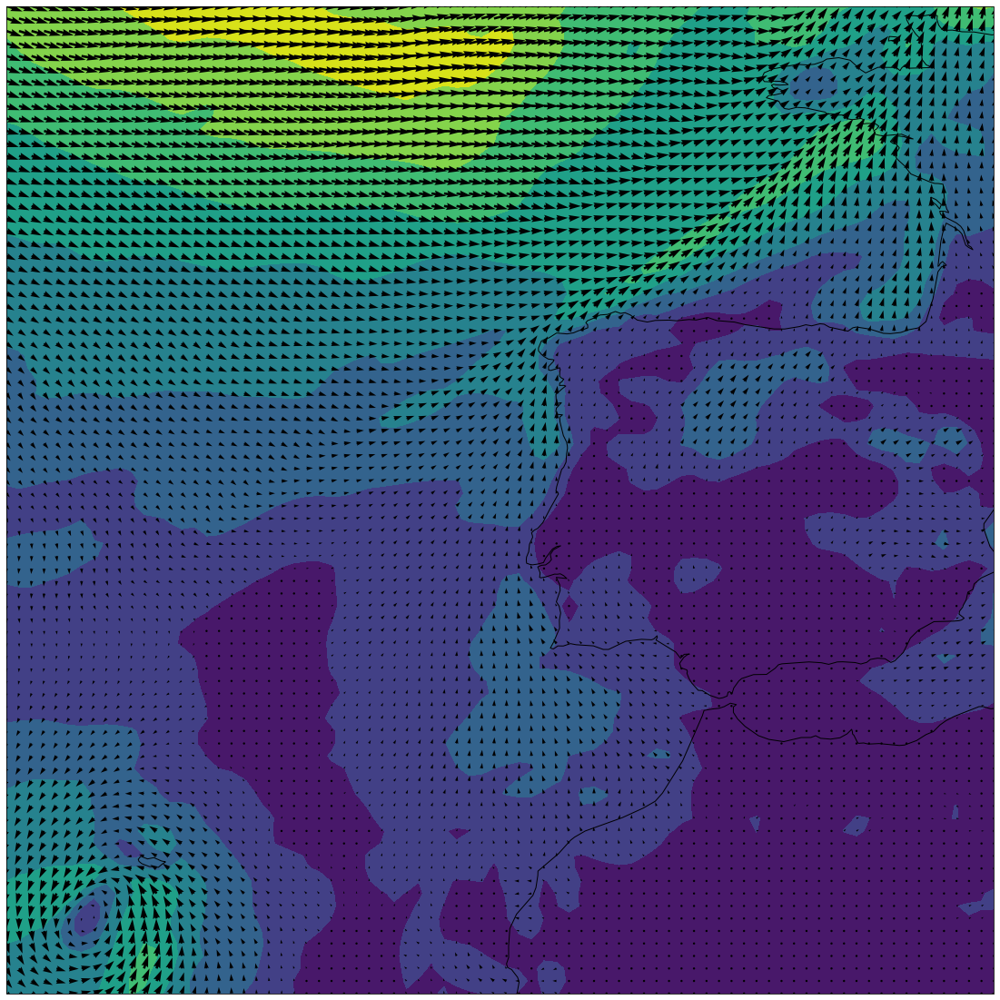

In [10]:
fig = plt.figure(figsize=(30, 20))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.contourf(lon, lat, ws,
             transform=ccrs.PlateCarree())
ax.quiver(lon, lat, u, v)


ax.coastlines()
plt.show()

In [4]:
lon = nc2['longitude']
lat = nc2['latitude']

latidx1 = (lat >=0 ) & (lat <=40) 
lonidx1 = (lon>=250) 
u = nc2['uwnd'][latidx1,lonidx1]
v = nc2['vwnd'][latidx1,lonidx1]
lon = nc2['longitude'][lonidx1]
lat = nc2['latitude'][latidx1]
ws = np.sqrt(u**2+v**2)

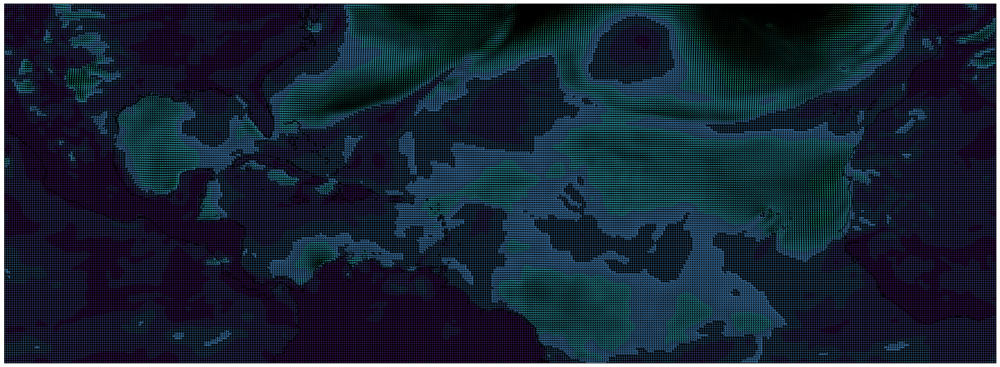

In [5]:
fig = plt.figure(figsize=(30, 20))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.contourf(lon, lat, ws,
             transform=ccrs.PlateCarree())
ax.quiver(lon, lat, u, v)


ax.coastlines()
plt.show()

In [7]:
lons = fh.variables['longitude'][:]
lats = fh.variables['latitude'][:]
uwnd = fh.variables['uwnd'][:]
vwnd = fh.variables['vwnd'][:]

tmax_units = fh.variables['uwnd'].units


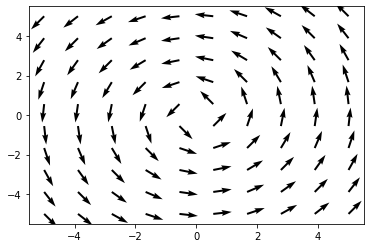

In [8]:
import numpy as np
import matplotlib.pyplot as plt

x,y = np.meshgrid(np.linspace(-5,5,10),np.linspace(-5,5,10))

u = -y/np.sqrt(x**2 + y**2)
v = x/np.sqrt(x**2 + y**2)

plt.quiver(x,y,u,v)
plt.show()

In [9]:
#### CCMP RT

In [10]:
YEAR = "2019"
MONTH = "11"
DAY = "03"
url = f"https://data.remss.com/ccmp/v02.1.NRT/Y{YEAR}/M{MONTH}/CCMP_RT_Wind_Analysis_{YEAR}{MONTH}{DAY}_V02.1_L3.0_RSS.nc"


DESTINATION = {
    "lat": 16.2783625,
    "long": -61.2888681+360,
}
START = {
    "lat": 28.6452462,
    "long":-16.9537225+360
}

In [11]:
-61.2888681+360

298.7111319

In [12]:
-16.9537225+360

343.0462775

In [13]:
import requests


In [18]:
r = requests.get(url)

In [19]:
open(f"{YEAR}_{MONTH}_{DAY}_CCMP.nc", 'wb').write(r.content)

47648621

In [20]:

my_example_nc_file = f"./{YEAR}_{MONTH}_{DAY}_CCMP.nc"
#my_example_nc_file = './interim_2014-07-01to2014-07-31_00061218.nc'
fh = Dataset(my_example_nc_file, mode='r')

ncw = xr.open_dataset(my_example_nc_file)
nc2 = ncw.sel(time = slice(f'{YEAR}-{MONTH}-{DAY}T06:00:00', f'{YEAR}-{MONTH}-{DAY}T06:00:00')).mean('time')
lon = nc2['longitude']
lat = nc2['latitude']

latidx1 = (lat >=0 ) & (lat <=40) 
lonidx1 = (lon>=250) 
u = nc2['uwnd'][latidx1,lonidx1]
v = nc2['vwnd'][latidx1,lonidx1]
#u = nc2['u10'][latidx1,lonidx1]
#v = nc2['v10'][latidx1,lonidx1]
lon = nc2['longitude'][lonidx1]
lat = nc2['latitude'][latidx1]
ws = np.sqrt(u**2+v**2)

In [21]:
#regrid nc file

#da_input = xr.open_dataarray(my_example_nc_file) # the file the data will be loaded from
regrid_axis_lat = np.arange(-77.38, 78.38, 1) # new coordinates
regrid_axis_long = np.arange(0.125, 359.125, 1) # new coordinates
da_output = nc2.interp(latitude=regrid_axis_lat, longitude=regrid_axis_long) # specify calculation

In [22]:
lons = da_output['longitude']
lats = da_output['latitude']
latidxs = (lats >=0 ) & (lats <=40) 
lonidxs = (lons>=250) 
us = da_output['uwnd'][latidxs,lonidxs]
vs = da_output['vwnd'][latidxs,lonidxs]
#u = nc2['u10'][latidx1,lonidx1]
#v = nc2['v10'][latidx1,lonidx1]
lons = da_output['longitude'][lonidxs]
lats = da_output['latitude'][latidxs]
wss = np.sqrt(us**2+vs**2)

In [23]:

geodesic_point = []
lat_points = []
long_points = []
for f in np.linspace(0,1,100):
    d = np.arccos(np.sin(START["lat"]*np.pi/180) * np.sin(DESTINATION["lat"]*np.pi/180) + np.cos(START["lat"]*np.pi/180) * np.cos(DESTINATION["lat"]*np.pi/180) * np.cos(START["long"]*np.pi/180 - DESTINATION["long"]*np.pi/180))
    A = np.sin((1 - f) * d) / np.sin(d)
    B = np.sin(f * d) / np.sin(d)
    x = A * np.cos(START["lat"]*np.pi/180) * np.cos(START["long"]*np.pi/180) + B * np.cos(DESTINATION["lat"]*np.pi/180) * np.cos(DESTINATION["long"]*np.pi/180)
    y = A * np.cos(START["lat"]*np.pi/180) * np.sin(START["long"]*np.pi/180) + B * np.cos(DESTINATION["lat"]*np.pi/180) * np.sin(DESTINATION["long"]*np.pi/180)
    z = A * np.sin(START["lat"]*np.pi/180) + B * np.sin(DESTINATION["lat"]*np.pi/180)

    lat_f = np.arctan2(z, np.sqrt(x**2 + y**2))
    lon_f = np.arctan2(y,x)
    lat_points.append(lat_f*180/np.pi)
    long_points.append( lon_f*180/np.pi)


In [24]:
lat_f*180/np.pi, lon_f*180/np.pi

(16.2783625, -61.288868100000016)

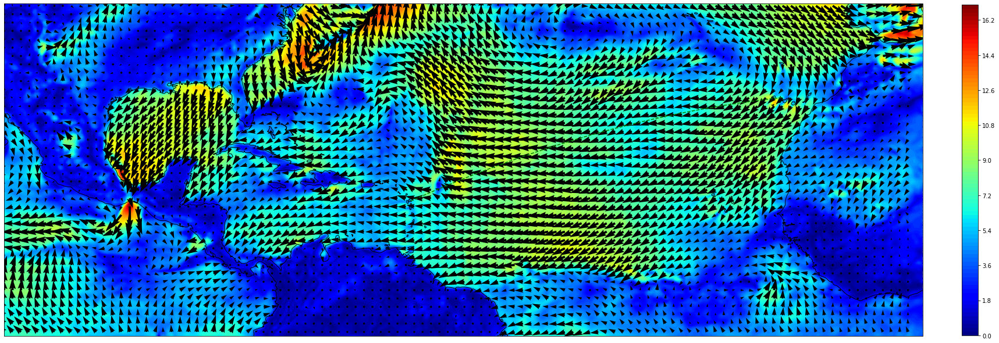

In [25]:
fig = plt.figure(figsize=(30, 20))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.stock_img()

#ax.plot([DESTINATION["long"],lon_f*180/np.pi, START["long"] ], [DESTINATION["lat"], lat_f*180/np.pi,START["lat"]],color='b', linestyle='--', transform=ccrs.Geodetic())


# plot geodesic line with custom function
ax.plot(long_points,lat_points,color='g', linestyle='--', transform=ccrs.PlateCarree())

#ax.scatter(LonD*180/np.pi, LatD*180/np.pi,s=1000, transform=ccrs.PlateCarree())


contours = ax.contourf(lon, lat, ws, 100,
             transform=ccrs.PlateCarree(), cmap='jet')

plt.colorbar(contours, fraction=0.017, pad=0.04)
ax.quiver(lons, lats, us, vs)
#ax.add_feature(cfeat.COASTLINE, edgecolor='gray', projection=ccrs.PlateCarree())

ax.coastlines()
plt.show()

[[-61.2888681   16.2783625 ]
 [-37.74595962  24.73801169]
 [-16.9537225   28.6452462 ]]


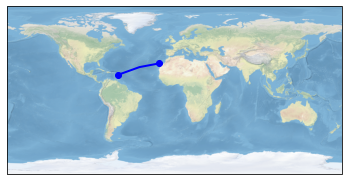

In [16]:
ax = plt.axes(projection=ccrs.PlateCarree())
ax.stock_img()
[handle] = plt.plot([DESTINATION["long"], START["long"] ], [DESTINATION["lat"], START["lat"]], color='blue', linewidth=2, marker='o', transform=ccrs.Geodetic())

t_path = handle._get_transformed_path()


path_in_data_coords, _ = t_path.get_transformed_path_and_affine()
print(path_in_data_coords.vertices)

In [ ]:
# Point C in Cartesian coordinates:
Cx = cos(radians(LatC)) * cos(radians(LonC))
Cy = cos(radians(LatC)) * sin(radians(LonC))
Cz = sin(radians(LatC))


Cr = sqrt((NewCx*NewCx) + (NewCy*NewCy) + (NewCz*NewCz))
NewCLat = degrees(asin(NewCz/Cr))
NewCLon = degrees(atan2(NewCy, NewCx))

In [17]:
def ll2cart(lon,lat):
    # http://rbrundritt.wordpress.com/2008/10/14/conversion-between-spherical-and-cartesian-coordinates-systems/
    x = np.cos(lat) * np.cos(lon)
    y = np.cos(lat) * np.sin(lon)
    z = np.sin(lat)
    return x,y,z

def cart2ll(x,y,z):
    # http://rbrundritt.wordpress.com/2008/10/14/conversion-between-spherical-and-cartesian-coordinates-systems/
    r = np.sqrt((x**2) + (y**2) + (z**2))
    lat = np.arcsin(z/r)
    lon = np.arctan2(y, x)
    return lon, lat

def distance(lon1, lat1, lon2, lat2):
    # http://code.activestate.com/recipes/576779-calculating-distance-between-two-geographic-points/
    # http://en.wikipedia.org/wiki/Haversine_formula
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    q = np.sin(dlat/2)**2 + (np.cos(lat1) * np.cos(lat2) * (np.sin(dlon/2)**2))
    return 2 * np.arctan2(np.sqrt(q), np.sqrt(1-q))

In [18]:
import vpython
# A and B are both vectors
# The crossproduct AxB is the rotation pole vector P:
A_cart= ll2cart(START["long"]*np.pi/180, START["lat"]*np.pi/180)
B_cart = ll2cart(DESTINATION["long"]*np.pi/180, DESTINATION["lat"]*np.pi/180)

P = np.cross(A_cart,B_cart)

LonP, LatP = cart2ll(*P)

<IPython.core.display.Javascript object>

In [19]:
LonP*180/np.pi, LatP*180/np.pi

(-2.4577321039694184, -60.56813818442549)

In [20]:
RotAngle = distance(START["long"]*np.pi/180,START["lat"]*np.pi/180,DESTINATION["long"]*np.pi/180,DESTINATION["lat"]*np.pi/180)
# Point C in Cartesian coordinates:
Cx,Cy,Cz = ll2cart(DESTINATION["long"]*np.pi/180, DESTINATION["lat"]*np.pi/180)
C = vpython.vector(Cx,Cy,Cz)

# C rotated to D:
D = vpython.rotate(C,RotAngle, vpython.vector(*P))
LonD,LatD = cart2ll(D.x,D.y,D.z)


In [21]:
ll2cart(0,np.pi/2)

(6.123233995736766e-17, 0.0, 1.0)

In [22]:
import numpy as np
import math

def rotation_matrix(axis, theta):
    """
    Return the rotation matrix associated with counterclockwise rotation about
    the given axis by theta radians.
    """
    axis = np.asarray(axis)
    axis = axis / math.sqrt(np.dot(axis, axis))
    a = math.cos(theta / 2.0)
    b, c, d = -axis * math.sin(theta / 2.0)
    aa, bb, cc, dd = a * a, b * b, c * c, d * d
    bc, ad, ac, ab, bd, cd = b * c, a * d, a * c, a * b, b * d, c * d
    return np.array([[aa + bb - cc - dd, 2 * (bc + ad), 2 * (bd - ac)],
                     [2 * (bc - ad), aa + cc - bb - dd, 2 * (cd + ab)],
                     [2 * (bd + ac), 2 * (cd - ab), aa + dd - bb - cc]]) 

new_D = np.dot(rotation_matrix(np.cross(P,[0,0,1]), np.arccos(np.dot(P,[0,0,1])/(np.linalg.norm(P)*np.linalg.norm([0,0,1])))), [C.x,C.y,C.z])
LonD_new, LatD_new = cart2ll(*new_D)

In [23]:
LonD_new*180/np.pi,LatD_new*180/np.pi

(-127.23818670963303, -1.5902773407317584e-15)

In [32]:
lat_arr = np.tile(lat.values, (len(lon),1))

In [33]:
np.dot(rotation_matrix(np.cross(P,[0,0,1]), np.arccos(np.dot(P,[0,0,1])/(np.linalg.norm(P)*np.linalg.norm([0,0,1])))), lat_arr)

ValueError: shapes (3,3) and (440,160) not aligned: 3 (dim 1) != 440 (dim 0)

In [48]:
rotation_matrix(np.cross(P,[0,0,1]), np.arccos(np.dot(P,[0,0,1])/(np.linalg.norm(P)*np.linalg.norm([0,0,1]))))

array([[-0.86750022,  0.08015656, -0.49093614],
       [ 0.08015656,  0.99655953,  0.02107189],
       [ 0.49093614, -0.02107189, -0.87094069]])

In [43]:
#regrid nc file

#da_input = xr.open_dataarray(my_example_nc_file) # the file the data will be loaded from
regrid_axis_lat = np.arange(-77.38, 78.38, 1) # new coordinates
regrid_axis_long = np.arange(0.125, 359.125, 1) # new coordinates
da_output = nc2.interp(latitude=regrid_axis_lat, longitude=regrid_axis_long) # specify calculation

#da_output.to_netcdf('output.nc') # save direct to file

In [ ]:
def rose_axis_settings(ax):
    ax.set_theta_direction('clockwise')
    ax.set_theta_zero_location('N')
    ax.set_xticklabels(['', '', 'E', '', 'S', '', 'W', ''])
    ax.set_yticklabels('')

fig = plt.figure(figsize=[12,6])
ax1 = fig.add_subplot(121, projection='polar')
ax2 = fig.add_subplot(122, projection='polar')
ax1.bar(np.radians(energy_wind_roses.index.values), energy_wind_roses.dir, width=np.radians(360.0/energy_wind_roses.shape[0]+1), color=edf_green)
ax2.bar(np.radians(energy_wind_roses.index.values), energy_wind_roses.energy, width=np.radians(360.0/energy_wind_roses.shape[0]+1), color=edf_blue)
[rose_axis_settings(ax) for ax in [ax1,ax2]]
ax1.set_title('Wind Rose')
ax2.set_title('Energy Rose')
plt.tight_layout()
plt.show()

In [ ]:

#!/usr/bin/env python
from ecmwfapi import ECMWFDataServer
    
server = ECMWFDataServer()
    
server.retrieve({
    'stream'    : "oper",
    'levtype'   : "sfc",
    'param'     : "165.128/166.128/167.128",
    'dataset'   : "interim",
    'step'      : "0",
    'grid'      : "0.75/0.75",
    'time'      : "00/06/12/18",
    'date'      : "2019-07-01/to/2019-07-31",
    'type'      : "an",
    'class'     : "ei",
    'format'    : "netcdf",
    'target'    : "interim_2014-07-01to2014-07-31_00061218.nc"
 })

In [2]:

#!/usr/bin/env python
from ecmwfapi import ECMWFDataServer
    
server = ECMWFDataServer()
    
server.retrieve({
    'stream'    : "oper",
    'levtype'   : "sfc",
    'param'     : "165.128/166.128/167.128",
    'dataset'   : "interim",
    'step'      : "0",
    'grid'      : "0.75/0.75",
    'time'      : "00/06/12/18",
    'date'      : "2019-07-01/to/2019-07-31",
    'type'      : "an",
    'class'     : "ei",
    'target'    : "interim_2014-07-01to2014-07-31_00061218.grib"
 })

2021-10-11 13:11:46 ECMWF API python library 1.6.1
2021-10-11 13:11:46 ECMWF API at https://api.ecmwf.int/v1
2021-10-11 13:11:47 Welcome Louis Veillon
2021-10-11 13:11:48 In case of problems, please check https://confluence.ecmwf.int/display/WEBAPI/Web+API+FAQ or contact servicedesk@ecmwf.int
2021-10-11 13:11:49 Request submitted
2021-10-11 13:11:49 Request id: 61641bf5fd323db8079801ee
2021-10-11 13:11:49 Request is submitted
2021-10-11 13:11:50 Request is active
Calling 'nice mars /tmp/20211011-1110/35/tmp-_marshkYGDi.req'
mars - WARN -
mars - WARN - From 29 January 2019 10AM (UTC) MARS uses the interpolation
mars - WARN - provided by the MIR library. For more details, see
mars - WARN - https://confluence.ecmwf.int/display/UDOC/MARS+interpolation+with+MIR
mars - WARN -
MIR environment variables:
MIR_CACHE_PATH=/data/ec_coeff
mars - INFO   - 20211011.111149 - Welcome to MARS
mars - INFO   - 20211011.111149 - MARS Client bundle version: 6.28.6.1
mars - INFO   - 20211011.111149 - MARS Cl

In [2]:
from mpl_toolkits.basemap import Basemap
bm = Basemap()   # default: projection='cyl'
print(bm.is_land(99.675, 13.104))
print(bm.is_land(100.539, 13.104))  

True
False


In [22]:
import geopy.distance

coords_1 = (28.6452462, -16.9537225)
coords_2 = (16.2783625,  -61.2888681)

print(geopy.distance.distance(coords_1, coords_2).km)

4734.429194467761


In [14]:
DESTINATION = {
    "lat": 16.2783625,
    "long": -61.2888681#+360,
}
START = {
    "lat": 28.6452462,
    "long":-16.9537225#+360
}

X = cos θb * sin ∆L

Y = cos θa * sin θb – sin θa * cos θb * cos ∆L

In [19]:
x = np.cos(DESTINATION["lat"]*np.pi/180)*np.sin(DESTINATION["long"]*np.pi/180-START["long"]*np.pi/180)
y = np.cos(START["lat"]*np.pi/180)*np.sin(DESTINATION["lat"]*np.pi/180)-np.sin(START["lat"]*np.pi/180)*np.cos(DESTINATION["lat"]*np.pi/180)*np.cos(DESTINATION["long"]*np.pi/180-START["long"]*np.pi/180)
beta = np.arctan2(x,y)

In [21]:
beta*180/np.pi+360

262.9346996275231

start 295° 23′ 03″

end 277° 32′ 34″

Fixed heading = 262.9347

Fixed heading other source : 252 39 13

angular DISTANCE 4702km

harvesine distance 4684km

vinelis distance 4734.4291

In [3]:
url = "https://public-api.meteofrance.fr/public/arome/1.0/wcs/MF-NWP-HIGHRES-AROME-0025-FRANCE-WCS/GetCoverage?SERVICE=WCS&VERSION=2.0.1&REQUEST=GetCoverage&format=image/tiff&coverageId=WIND__SPECIFIC_HEIGHT_LEVEL_ABOVE_GROUND___2021-10-11T06:00:00Z&subset=time(2021-10-11T10:00:00Z)&subset=lat(27.73700364691871,56.55575894476377)&subset=long(-20.084146430236565,26.153945403194832)&subset=height(10)"

In [14]:
url = "http://dcpc-nwp.meteo.fr/services/PS_GetCache_DCPCPreviNum?token=__5yLVTdr-sGeHoPitnFc7TZ6MhBcJxuSsoZp6y0leVHU__&model=AROME&grid=0.01&package=SP1&time=00H&referencetime=2021-10-11T03:00:00Z&format=grib2"

In [15]:
r = requests.get(url)

In [16]:
open(f"{2021}_{10}_{11}_AROME.grib2", 'wb').write(r.content)

17226887

In [15]:
ds = xr.open_dataset(f"{2021}_{10}_{11}_AROME.grib2", engine="netcdf4")

OSError: [Errno -51] NetCDF: Unknown file format: b'C:\\Users\\Veillon Louis\\Documents\\6_Personal Project\\mini\\2021_10_11_AROME.grib2'

In [1]:
import Magics.macro as magics

In [2]:
europe = magics.mmap(
    subpage_clipping              = "on",
    subpage_lower_left_latitude   = 21.51,
    subpage_lower_left_longitude  = -37.27,
    subpage_upper_right_latitude  = 51.28,
    subpage_upper_right_longitude = 65.0,
    subpage_map_projection        = "polar_stereographic",
    page_id_line                  = "off")

#Background Coastlines 
foreground = magics.mcoast({"map_coastline_colour"     : "black",
                            "map_coastline_land_shade" : "off",
                            "map_coastline_sea_shade"  : "off",
                            "map_grid"                 : "off",
                            "map_label"                : "off"})

#Import the  wind
uv700 = magics.mgrib( 
    grib_input_file_name = './2021_10_11_06_003_GFS_uv_filter.grib2',
    grib_wind_position_1 = 0,
    grib_wind_position_2 = 1)

In [3]:
# Define wind flags plotting
uv700_wind = magics.mwind(
    legend = 'off',
    wind_arrow_unit_system       = "automatic",
    wind_arrow_unit_velocity     = 10.0,
    wind_field_type              = "Flags",
    wind_flag_colour             = "black",
    wind_flag_length             = 0.6,
    wind_flag_origin_marker      = "dot",
    wind_flag_origin_marker_size = 0.1,
    wind_thinning_factor         = 1.,
    wind_thinning_method         = "automatic")

title = magics.mtext( 
    text_lines          = ["<font size='1'>Vorticity and wind flags</font>",
                           "Vorticity at 700 hPa"],
    text_mode           = 'positional',
    text_box_x_position = 1.0,
    text_box_y_position = 17.5,
    text_box_x_length   = 27.0,
    text_box_y_length   = 2.3,
    text_justification  = 'center',
    text_font_size      = 0.6,
    text_colour         = 'charcoal')

In [7]:
#Load the  vorticity
vo700 = magics.mgrib( 
    grib_input_file_name = './interim_2014-07-01to2014-07-31_00061218.grib',
    grib_field_position  = 2)

In [8]:
# Vorticity contour
vo700_contour = magics.mcont({
                    "legend"                      : "on", 
                    "contour"                     : "off",
                    "contour_highlight"           : "off",
                    "contour_hilo"                : "off",
                    "contour_label"               : "off",
                    "contour_legend_text"         : "Contour shade (MORE CONTOURS) Range: -200 / 200",
                    "contour_level_list"          : [-200.0, -100.0, -75.0, -50.0, -30.0, -20.0,
                                                     -15.0, -13.0, -11.0, -9.0, -7.0, -5.0, -3.0, 
                                                     -1.0, 1.0, 3.0, 5.0, 7.0, 9.0, 11.0, 13.0, 
                                                     15.0, 20.0, 30.0, 50.0, 75.0, 100.0, 200.0],
                    "contour_level_selection_type": "level_list",
                    "contour_shade"               : "on",
                    "contour_shade_colour_list"   : ["rgb(0,0,0.3)","rgb(0,0,0.5)","rgb(0,0,0.7)",
                                                     "rgb(0,0,0.9)","rgb(0,0.15,1)","rgb(0,0.3,1)",
                                                     "rgb(0,0.45,1)","rgb(0,0.6,1)","rgb(0,0.75,1)",
                                                     "rgb(0,0.85,1)","rgb(0.2,0.95,1)","rgb(0.45,1,1)",
                                                     "rgb(0.75,1,1)","rgba(0,0,0,0)","rgb(1,1,0)","rgb(1,0.9,0)",
                                                     "rgb(1,0.8,0)","rgb(1,0.7,0)","rgb(1,0.6,0)",
                                                     "rgb(1,0.5,0)","rgb(1,0.4,0)","rgb(1,0.3,0)",
                                                     "rgb(1,0.15,0)","rgb(0.9,0,0)","rgb(0.7,0,0)",
                                                     "rgb(0.5,0,0)","rgb(0.3,0,0)"],
                    "contour_shade_colour_method" : "list",
                    "contour_shade_method"        : "area_fill"}) 

In [9]:
# Defining the legend
vo700_legend = magics.mlegend(
    legend_box_mode       = 'positional',
    legend_box_x_position = 1.0,
    legend_box_y_position = 16.0,
    legend_box_x_length   = 27.0,
    legend_box_y_length   = 1.5,
    legend_text_colour    = 'charcoal',
    legend_border         = 'off',
    legend_display_type   = 'continuous',
    legend_text_font_size = 0.5)

In [ ]:
#To the plot
magics.plot(europe, uv700, uv700_wind, foreground, title)

In [ ]:
magics.plot(europe, foreground)

In [ ]:
import Magics.macro as magics

import os

os.environ["MAGPLUS_HOME"] ="C:/BCG/anaconda3/envs/wind/Library"

# Setting the projection
australia = magics.mmap(
    subpage_upper_right_longitude= 180.,
    subpage_upper_right_latitude = -5.,
    subpage_lower_left_longitude = 105.,
    subpage_clipping             = 'on',
    subpage_map_projection       = "cylindrical",
    subpage_lower_left_latitude  = -55.,
    page_id_line                 = "off")

# Defining the coastlines
light_background = magics.mcoast(
    map_coastline_sea_shade_colour  = 'white',
    map_coastline_land_shade_colour = 'cream',
    map_grid                        = 'off',
    map_coastline_land_shade        = 'on',
    map_coastline_sea_shade         = 'on',
    map_label                       = 'off',
    map_coastline_colour            = 'tan')

# Load the grib data
wind_from_grib = magics.mgrib(
    grib_input_file_name = './interim_2014-07-01to2014-07-31_00061218.grib', 
    grib_wind_position_1 = 1,
    grib_wind_position_2 = 2)

# Defining Wind plotting
wind_arrows = magics.mwind(
    legend                = 'on',
    wind_field_type       = 'arrows',
    wind_arrow_thickness  = 1,
    wind_thinning_factor  = 5.,
    wind_arrow_calm_below = 10,
    wind_arrow_colour     = 'evergreen' )

# Setting the legend
legend = magics.mlegend(
    legend_display_type   = "continuous",
    legend_box_mode       = "automatic",
    legend_box_y_position = 17.00,
    legend_box_x_length   = 32.0,
    legend_box_y_length   = 1.50,
    legend_text_colour    = "charcoal",
    legend_text_font_size = "0.4"
)

magics.plot(australia, wind_from_grib, wind_arrows, light_background, legend)

In [2]:
grib = magics.mgrib(grib_input_file_name = "test.grb", grib_wind_position_1 = 1)
contour = magics.mcont(contour_line_colour = "blue")
coast = magics.mcoast()
magics.plot(coast, grib, contour)

NameError: name 'magics' is not defined

In [1]:
import eccodes
import gribapi

ModuleNotFoundError: No module named 'eccodes'

In [9]:

my_example_nc_file = f"./test.nc"
#my_example_nc_file = './interim_2014-07-01to2014-07-31_00061218.nc'
fh = Dataset(my_example_nc_file, mode='r')

ncw = xr.open_dataset(my_example_nc_file)
nc2 = ncw.sel(time = slice(f'2019-07-01T06:00:00', f'2019-07-01T06:00:00')).mean('time')
lon = nc2['longitude']
lat = nc2['latitude']

latidx1 = (lat >=0 ) & (lat <=40) 
lonidx1 = (lon>=250) 
#u = nc2['uwnd'][latidx1,lonidx1]
#v = nc2['vwnd'][latidx1,lonidx1]
u = nc2['u10'][latidx1,lonidx1]
v = nc2['v10'][latidx1,lonidx1]
lon = nc2['longitude'][lonidx1]
lat = nc2['latitude'][latidx1]
ws = np.sqrt(u**2+v**2)

In [8]:
nc2

<xarray.Dataset>
Dimensions:    (longitude: 480, latitude: 241)
Coordinates:
  * longitude  (longitude) float32 0.0 0.75 1.5 2.25 ... 357.0 357.8 358.5 359.2
  * latitude   (latitude) float32 90.0 89.25 88.5 87.75 ... -88.5 -89.25 -90.0
Data variables:
    u10        (latitude, longitude) float32 -1.716 -1.716 ... 5.285 5.285
    v10        (latitude, longitude) float32 2.62 2.62 2.62 ... -2.227 -2.227
    t2m        (latitude, longitude) float32 274.5 274.5 274.5 ... 217.4 217.4

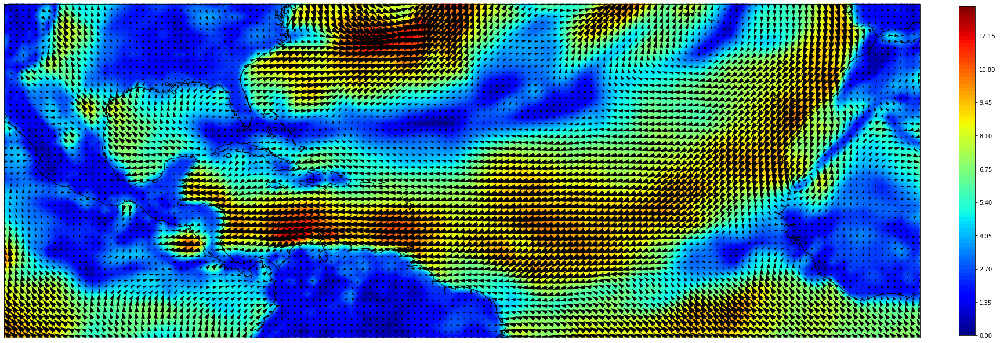

In [10]:
fig = plt.figure(figsize=(30, 20))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.stock_img()

#ax.plot([DESTINATION["long"],lon_f*180/np.pi, START["long"] ], [DESTINATION["lat"], lat_f*180/np.pi,START["lat"]],color='b', linestyle='--', transform=ccrs.Geodetic())


# plot geodesic line with custom function
#ax.plot(long_points,lat_points,color='g', linestyle='--', transform=ccrs.PlateCarree())

#ax.scatter(LonD*180/np.pi, LatD*180/np.pi,s=1000, transform=ccrs.PlateCarree())


contours = ax.contourf(lon, lat, ws, 100,
             transform=ccrs.PlateCarree(), cmap='jet')

plt.colorbar(contours, fraction=0.017, pad=0.04)
ax.quiver(lon, lat, u, v)
#ax.add_feature(cfeat.COASTLINE, edgecolor='gray', projection=ccrs.PlateCarree())

ax.coastlines()
plt.show()

# GFS

In [2]:
YEAR =2021
MONTH = 10
DAY = 11
HOUR  = "06" # 00, 06, 12, 18)
    
deg = "0p50" #0.5, 0.1, 1"
next_forecast = "000" #FFF is the forecast hour of product from 000 - 384

url = f"https://nomads.ncep.noaa.gov/pub/data/nccf/com/gfs/prod/gfs.{YEAR}{MONTH}{DAY}/{HOUR}/atmos/gfs.t{HOUR}z.pgrb2.{deg}.f{next_forecast}"

In [18]:
r = requests.get(url)

In [19]:
open(f"{YEAR}_{MONTH}_{DAY}_GFS.grib2", 'wb').write(r.content)

149627324

In [70]:
URL = "https://nomads.ncep.noaa.gov/cgi-bin/filter_gfs_0p25.pl?file=gfs.t12z.pgrb2.0p25.f003&lev_10_m_above_ground=on&var_UGRD=on&var_VGRD=on&leftlon=0&rightlon=360&toplat=90&bottomlat=-90&dir=%2Fgfs.20211010%2F12%2Fatmos"

In [71]:
r = requests.get(URL)

In [72]:
open(f"{YEAR}_{MONTH}_{DAY}_06_003_GFS_uv_filter.grib2", 'wb').write(r.content)

1917872

In [92]:
DA

11

In [4]:

my_example_nc_file = f"{YEAR}_{MONTH}_{DAY}_GFS.nc"
#my_example_nc_file = './interim_2014-07-01to2014-07-31_00061218.nc'
#fh = Dataset(my_example_nc_file, mode='r')

ncw = xr.open_dataset(my_example_nc_file)

In [6]:

my_example_nc_file = f"{YEAR}_{MONTH}_{DAY}_GFS.nc"
#my_example_nc_file = './interim_2014-07-01to2014-07-31_00061218.nc'
#fh = Dataset(my_example_nc_file, mode='r')

ncw = xr.open_dataset(my_example_nc_file)
nc2 = ncw.sel(time = slice(f'2021-10-10T12:00:00', f'2021-10-10T12:00:00')).mean('time')
lon = nc2['longitude']
lat = nc2['latitude']

latidx1 = (lat >=0 ) & (lat <=40) 
lonidx1 = (lon>=250) 
#u = nc2['uwnd'][latidx1,lonidx1]
#v = nc2['vwnd'][latidx1,lonidx1]
u = nc2['u10'][latidx1,lonidx1]
v = nc2['v10'][latidx1,lonidx1]
lon = nc2['longitude'][lonidx1]
lat = nc2['latitude'][latidx1]
ws = np.sqrt(u**2+v**2)

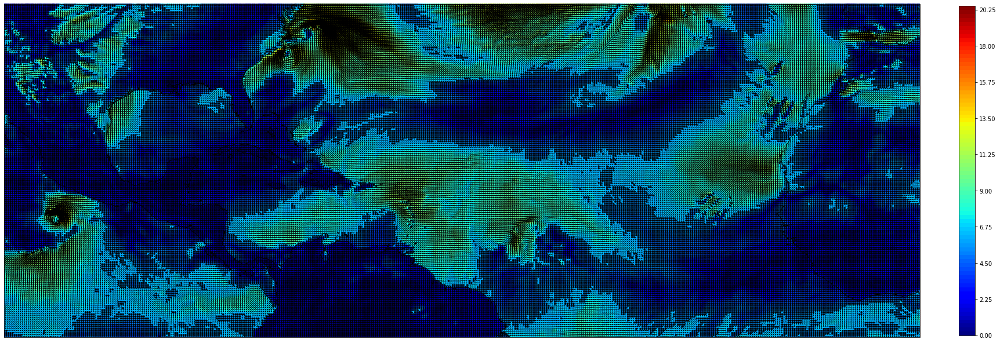

In [7]:
fig = plt.figure(figsize=(30, 20))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.stock_img()

#ax.plot([DESTINATION["long"],lon_f*180/np.pi, START["long"] ], [DESTINATION["lat"], lat_f*180/np.pi,START["lat"]],color='b', linestyle='--', transform=ccrs.Geodetic())


# plot geodesic line with custom function
#ax.plot(long_points,lat_points,color='g', linestyle='--', transform=ccrs.PlateCarree())

#ax.scatter(LonD*180/np.pi, LatD*180/np.pi,s=1000, transform=ccrs.PlateCarree())


contours = ax.contourf(lon, lat, ws, 100,
             transform=ccrs.PlateCarree(), cmap='jet')

plt.colorbar(contours, fraction=0.017, pad=0.04)
ax.quiver(lon, lat, u, v)
#ax.add_feature(cfeat.COASTLINE, edgecolor='gray', projection=ccrs.PlateCarree())

ax.coastlines()
plt.show()

In [41]:
# https://nomads.ncep.noaa.gov/cgi-bin/filter_gefs_atmos_0p50a.pl?dir=%2Fgefs.20211011%2F06%2Fatmos

In [5]:
ncw

<xarray.Dataset>
Dimensions:    (longitude: 1440, latitude: 721, time: 2)
Coordinates:
  * longitude  (longitude) float32 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
  * latitude   (latitude) float32 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * time       (time) datetime64[ns] 2021-10-10T12:00:00 2021-10-10T15:00:00
Data variables:
    u10        (time, latitude, longitude) float32 ...
    v10        (time, latitude, longitude) float32 ...
Attributes:
    Conventions:  CF-1.6
    history:      2021-10-11 17:14:35 GMT by grib_to_netcdf-2.23.0: C:\BCG\an...

In [76]:
720*361

259920

In [77]:
cftime.DatetimeGregorian(131148, 8, 8, 16, 0, 0, 0, has_year_zero=False)

NameError: name 'cftime' is not defined

In [85]:
nc2

<xarray.Dataset>
Dimensions:    (longitude: 720, latitude: 361)
Coordinates:
  * longitude  (longitude) float32 1.25 1.5 1.75 2.0 ... 180.2 180.5 180.8 181.0
  * latitude   (latitude) float32 181.2 181.5 181.8 182.0 ... 270.8 271.0 271.2
Data variables:
    u10        (latitude, longitude) float32 nan nan nan nan ... nan nan nan nan
    v10        (latitude, longitude) float32 nan nan nan nan ... nan nan nan nan

In [ ]:
# concat grib use cat or grib_copy

In [5]:
from ipywidgets import widget
from ipywidgets import interact

@interact(date = ["2021-10-10T12:00:00", "2021-10-10T15:00:00"])
def plot(date = "2021-10-10T12:00:00"):
    
    nc2 = ncw.sel(time = slice(f'{date}', f'{date}')).mean('time')
    lon = nc2['longitude']
    lat = nc2['latitude']

    latidx1 = (lat >=0 ) & (lat <=40) 
    lonidx1 = (lon>=250) 
    #u = nc2['uwnd'][latidx1,lonidx1]
    #v = nc2['vwnd'][latidx1,lonidx1]
    u = nc2['u10'][latidx1,lonidx1]
    v = nc2['v10'][latidx1,lonidx1]
    lon = nc2['longitude'][lonidx1]
    lat = nc2['latitude'][latidx1]
    ws = np.sqrt(u**2+v**2)

    fig = plt.figure(figsize=(30, 20))
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.stock_img()

    #ax.plot([DESTINATION["long"],lon_f*180/np.pi, START["long"] ], [DESTINATION["lat"], lat_f*180/np.pi,START["lat"]],color='b', linestyle='--', transform=ccrs.Geodetic())


    # plot geodesic line with custom function
    #ax.plot(long_points,lat_points,color='g', linestyle='--', transform=ccrs.PlateCarree())

    #ax.scatter(LonD*180/np.pi, LatD*180/np.pi,s=1000, transform=ccrs.PlateCarree())


    contours = ax.contourf(lon, lat, ws, 100,
                 transform=ccrs.PlateCarree(), cmap='jet')

    plt.colorbar(contours, fraction=0.017, pad=0.04)
    ax.quiver(lon, lat, u, v)
    #ax.add_feature(cfeat.COASTLINE, edgecolor='gray', projection=ccrs.PlateCarree())

    ax.coastlines()
    return plt.show()

interactive(children=(Dropdown(description='date', options=('2021-10-10T12:00:00', '2021-10-10T15:00:00'), val…